In [ ]:
# Input data files are available in the read-only "../input/" directory
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import torchvision.transforms as transforms
import torchvision.transforms.functional  as F
from PIL import Image
import torch
import random
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from time import time

<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I2wUTT12p5bX3RCku_T_82aD4tkY9LVY" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов.

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>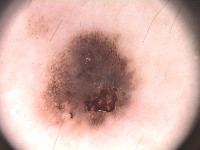</td><td>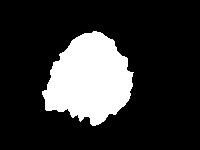</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

Download from Kaggle Competitions

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

Download fron DropBox

In [ ]:
# Assign the Kaggle data set URL into variable
dataset = "https://www.kaggle.com/datasets/kanametov/ph2dataset"
# Using opendatasets let's download the data sets
od.download(dataset)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  viktorsok92


Your Kaggle Key:

  ································


Dataset URL: https://www.kaggle.com/datasets/kanametov/ph2dataset


100%|██████████| 203M/203M [00:01<00:00, 119MB/s] 


Download from drop-box

In [ ]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

# если по ссылке слишком много запросов, датасет можно скачать с kaggle: https://www.kaggle.com/datasets/kanametov/ph2dataset

--2024-04-21 08:54:36--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/8lqrloi0mxj2acu/PH2Dataset.rar [following]
--2024-04-21 08:54:37--  https://www.dropbox.com/s/raw/8lqrloi0mxj2acu/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 429 Too Many Requests
2024-04-21 08:54:37 ERROR 429: Too Many Requests.



In [ ]:
!apt-get install unrar

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  unrar
0 upgraded, 1 newly installed, 0 to remove and 54 not upgraded.
Need to get 113 kB of archives.
After this operation, 406 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/multiverse amd64 unrar amd64 1:5.6.6-2build1 [113 kB]
Fetched 113 kB in 0s (796 kB/s) 
Selecting previously unselected package unrar.
(Reading database ... 110195 files and directories currently installed.)
Preparing to unpack .../unrar_1%3a5.6.6-2build1_amd64.deb ...
Unpacking unrar (1:5.6.6-2build1) ...
Setting up unrar (1:5.6.6-2build1) ...
update-alternatives: using /usr/bin/unrar-nonfree to provide /usr/bin/unrar (unrar) in auto mode
update-alternatives: warning: skip creation of /usr/share/man/man1/unrar.1.gz because associated file /usr/share/man/man1/unrar-nonfree.1.gz (of link group unrar) doesn't exist
Processing triggers f

In [ ]:
!unrar x "/kaggle/working/PH2Dataset.rar"

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
  images = []
  lesions = []
  from skimage.io import imread
  import os
  root = 'ph2dataset'

  for root, dirs, files in os.walk(os.path.join(root, 'PH2Dataset')):
      if root.endswith('_Dermoscopic_Image'):
          images.append(imread(os.path.join(root, files[0])))
      if root.endswith('_lesion'):
          lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

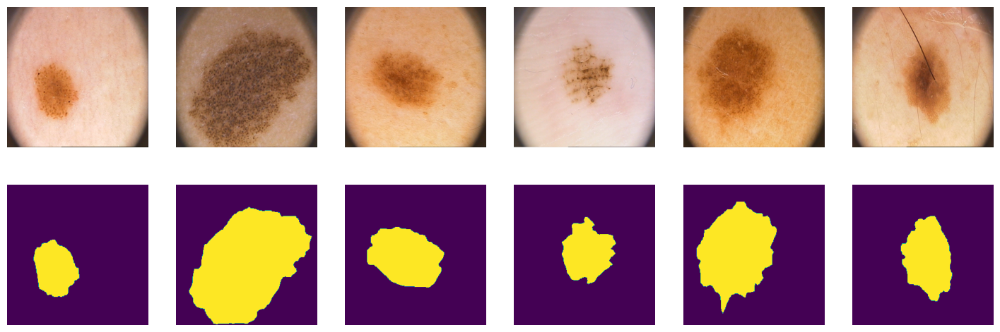

In [ ]:
plt.figure(figsize=(18, 6))
for i in range(6):
    j = np.random.randint(0, len(X))
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[j])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[j])

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [ ]:
ix = np.random.choice(len(X), len(X), False) # shuffling
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


# Сделаем аугментацию данных, т.к. всего 100 примеров в трейне, доведём до 1000 примеров

In [ ]:
import torchvision.transforms.functional  as F

class Identity_trans(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, image):
        return image

class Augmenter_for_Segmentation():
#     @staticmethod
#     def toArray(tensor):
#         return np.moveaxis(tensor.numpy(), 0, 2)

    def __init__(self):
        self.to_tensor = transforms.ToTensor()
        self.to_array = lambda tensor: np.moveaxis(tensor.numpy(), 0, 2)
        self.trans = [Identity_trans(), transforms.RandomHorizontalFlip(p=1),  transforms.RandomVerticalFlip(p=1), \
                          transforms.Compose([transforms.RandomHorizontalFlip(p=1), transforms.RandomVerticalFlip(p=1)])]
        #self.scale = None
        self.degree = None
        self.flip = None
        self.crop_size = None
        self.color_jitter = transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1)
        self.resize = transforms.Resize(256, antialias=True)
    def __augment_geometry(self, tensor, repeat = False):
        if not repeat:
            #self.scale = transforms.RandomResizedCrop.get_params(torch.empty([3, 256, 256]), [0.7, 0.9], [0.75, 1.3333333333333333])
            self.degree = transforms.RandomRotation.get_params([-25,25])
            self.flip = random.choice([0, 1, 2, 3])
            self.crop_size = random.choice([176, 186, 196, 206])

        if self.degree is None or self.flip is None or self.crop_size is None:
            raise ValueError("Apply augmentation with repeat = False first")

        tensor = self.trans[self.flip](tensor)

        #i, j, h, w = self.scale
        #tensor = F.resized_crop(tensor, i, j, h, w, 256, antialias=True)
        tensor = F.rotate(tensor, self.degree)
        tensor = F.center_crop(tensor, self.crop_size)
        tensor = F.resize(tensor, 256, antialias=True)
        return tensor

    def __augment_color(self, tensor):
        return self.color_jitter(tensor)

    def __call__(self, imgs):
        """
        imgs must be ndarray of shape 256x256x3
        Applies data augmentation to source and target image for segmentation tasks
        """
        x,y = imgs
        trans_x = self.__augment_geometry(self.__augment_color(self.to_tensor(x)), repeat=False)
        trans_y = self.__augment_geometry(self.to_tensor(y), repeat=True)
        return [self.to_array(trans_x), self.to_array(trans_y)]

In [ ]:
aug = Augmenter_for_Segmentation()

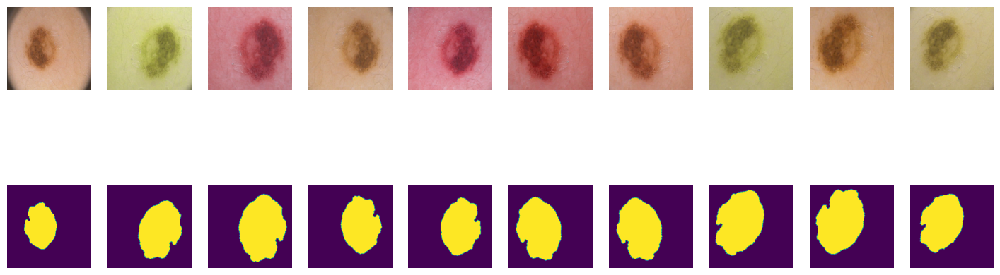

In [ ]:
plt.figure(figsize=(18, 6))
j = np.random.randint(0, len(X))
orig = False
for i in range(10):
    if not orig:
        x, y = X[j], Y[j]
        orig = True
    else:
        x, y = aug([X[j], Y[j]])
    plt.subplot(2, 10, i+1)
    plt.axis("off")
    plt.imshow(x)

    plt.subplot(2, 10, i+11)
    plt.axis("off")
    plt.imshow(y)


In [ ]:
# Применим аугментации к трейну (concatenate и append не самые эффективные функции, т.к. создают копии)
X_aug = X[tr].copy()
Y_aug = Y[tr].copy()
for x,y in zip(X[tr], Y[tr]):
    # создаём массивы заполненные мусором как placeholders
    # для соответствия размерностей
    aug_x = np.empty((256,256,3))
    aug_y = np.empty((256,256,1))
    for _ in range(10):
        x_trans, y_trans = aug([x,y])
        aug_x = np.concatenate([aug_x, x_trans])
        aug_y = np.concatenate([aug_y, y_trans])
    aug_x = aug_x.reshape((-1,256,256,3))
    aug_y = aug_y.reshape((-1,256,256))
    # исключаем мусорные массивы из датасета
    X_aug = np.append(X_aug, aug_x[1:], axis = 0)
    Y_aug = np.append(Y_aug, aug_y[1:], axis = 0)

Посмотрим на адекватность сделанных аугментаций

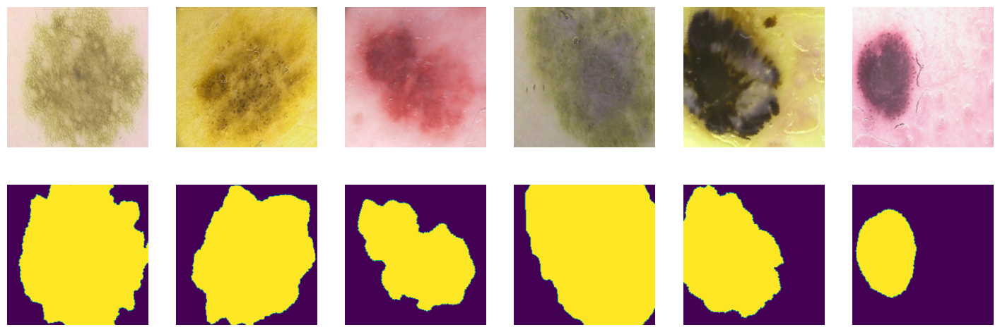

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    j = np.random.randint(0, len(X_aug))
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X_aug[j])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y_aug[j])


#### PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader
batch_size = 50
X_aug = X_aug.astype(np.float32)
data_tr = DataLoader(list(zip(np.rollaxis(X_aug, 3, 1), Y_aug[:, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=False)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=False)

# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

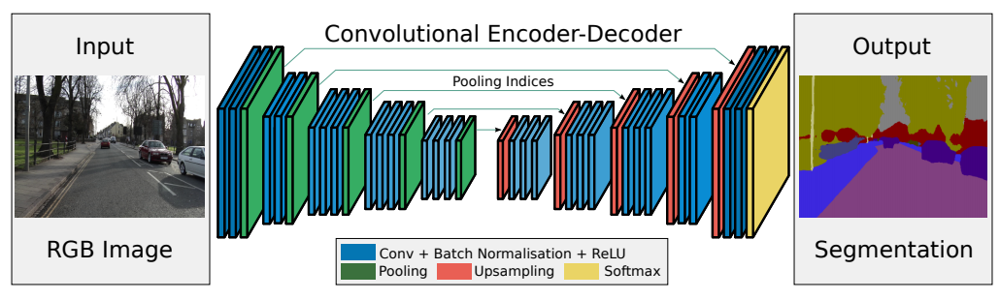

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.relu = nn.ReLU()
        self.MaxPool = nn.MaxPool2d((2, 2), return_indices=True) # downsampling for encoder and return indices
        self.MaxUnpool = nn.MaxUnpool2d(2, stride=2) # upsampling for decoder
        # encoder (downsampling)
        # 256 x 256
        self.enc_conv0 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.enc_bn0 = nn.BatchNorm2d(num_features=8)
        # 128x128
        self.enc_conv1 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.enc_bn1 = nn.BatchNorm2d(num_features=16)
        # 64x64
        self.enc_conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.enc_bn2 = nn.BatchNorm2d(num_features=32)
        # 32x32
        self.enc_conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.enc_bn3 = nn.BatchNorm2d(num_features=64)

        # bottleneck
        # 16x16
        self.bottleneck_conv = nn.Conv2d(64, 64, kernel_size=1)
        self.neck_bn = nn.BatchNorm2d(num_features=64)

        # decoder (upsampling).
        # 32x32
        self.dec_conv0 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
        self.dec_bn0 = nn.BatchNorm2d(num_features=32)
        # 64x64
        self.dec_conv1 = nn.Conv2d(32, 16, kernel_size=3, padding=1)
        self.dec_bn1 = nn.BatchNorm2d(num_features=16)
        # 128x128
        self.dec_conv2 = nn.Conv2d(16, 8, kernel_size=3, padding=1)
        self.dec_bn2 = nn.BatchNorm2d(num_features=8)
        # 256x256
        self.dec_conv3 = nn.Conv2d(8, 4, kernel_size=3, padding=1)
        self.dec_bn3 = nn.BatchNorm2d(num_features=4) # число feature maps равно числу классов сегментации

        # logits
        self.out_conv = nn.Conv2d(4,1, kernel_size = 1)


    def forward(self, x):
        # encoder
        orig_size = x.size()
        e0, ind0 = self.MaxPool(self.relu(self.enc_bn0(self.enc_conv0(x))))
        size0 = e0.size()
        e1, ind1 = self.MaxPool(self.relu(self.enc_bn1(self.enc_conv1(e0))))
        size1 = e1.size()
        e2, ind2 = self.MaxPool(self.relu(self.enc_bn2(self.enc_conv2(e1))))
        size2 = e2.size()
        e3, ind3 = self.MaxPool(self.relu(self.enc_bn3(self.enc_conv3(e2))))

        # bottleneck (preserves number of feature maps and size)
        b = self.relu(self.neck_bn(self.bottleneck_conv(e3)))

        # decoder
        d0 = self.MaxUnpool(b, ind3, output_size=size2)
        d0 = self.relu(self.dec_bn0(self.dec_conv0(d0)))

        d1 = self.MaxUnpool(d0, ind2, output_size=size1)
        d1 = self.relu(self.dec_bn1(self.dec_conv1(d1)))

        d2 = self.MaxUnpool(d1, ind1, output_size=size0)
        d2 = self.relu(self.dec_bn2(self.dec_conv2(d2)))

        d3 = self.MaxUnpool(d2, ind0, output_size=orig_size)
        d3 = self.relu(self.dec_bn3(self.dec_conv3(d3)))

        logits = self.out_conv(d3)
        return logits

In [ ]:
model = SegNet()

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
model.to(device)

SegNet(
  (relu): ReLU()
  (MaxPool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (MaxUnpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
  (enc_conv0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_bn0): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv1): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (enc_conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (enc_bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bottleneck_conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
  (neck_bn): BatchNorm2d(64, eps=1e-

In [ ]:
!pip install torchsummary

In [ ]:
from torchsummary import summary
summary(model, (3, 256, 256), batch_size = 50)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [50, 8, 256, 256]             224
       BatchNorm2d-2          [50, 8, 256, 256]              16
              ReLU-3          [50, 8, 256, 256]               0
         MaxPool2d-4  [[-1, 8, 128, 128], [-1, 8, 128, 128]]               0
            Conv2d-5         [50, 16, 128, 128]           1,168
       BatchNorm2d-6         [50, 16, 128, 128]              32
              ReLU-7         [50, 16, 128, 128]               0
         MaxPool2d-8  [[-1, 16, 64, 64], [-1, 16, 64, 64]]               0
            Conv2d-9           [50, 32, 64, 64]           4,640
      BatchNorm2d-10           [50, 32, 64, 64]              64
             ReLU-11           [50, 32, 64, 64]               0
        MaxPool2d-12  [[-1, 32, 32, 32], [-1, 32, 32, 32]]               0
           Conv2d-13           [50, 64, 32, 32]          18,496
    

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds

    return thresholded  # returns IoU for each sample in batch (tensor.size = BATCH)

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [ ]:
def bce_loss(y_real, y_pred):
    # TODO
    # please don't use nn.BCELoss. write it from scratch

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [ ]:
class EarlyStopper:
    """
    Early stopp if val loss don't decrease for n epochs (patience)
    """
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

In [ ]:
early_stopper = EarlyStopper(patience=3, min_delta=0.01)

In [ ]:
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
import pickle
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#writer = SummaryWriter('runs/experiment_1')

def train(model, opt, loss_fn, metric, epochs, data_tr, data_val,*, log_name = None):
    if log_name is None:
        raise RuntimeError("Enter log_name")

    sigmoid = torch.nn.Sigmoid()
    model.to(device)
    log_template = "epoch: {ep:02d}, epoch_time: {e_time:3.3f}, train_loss: {t_loss:0.3f}, val_loss {v_loss:0.3f}, val_IoU: {v_iou:0.3f}"

    # для усреднения лосса к одному пикселю
    N_tr = len(data_tr.dataset)*256*256
    N_val = len(data_val.dataset)*256*256
    #     N_tr = len(data_tr.dataset)
    #     N_val = len(data_val.dataset)
    curr_epoch = 0
    history = []
    for epoch in range(epochs):
        tic = time()

        curr_epoch = epoch + 1
        train_loss = 0
        model.train()  # train mode
        for X_batch, Y_label in tqdm(data_tr, total=len(data_tr)):
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_logits = model(X_batch.to(device))
            loss =  loss_fn(Y_logits, Y_label.to(device))
            loss.backward()
            opt.step()

            # calculate loss to show the user
            train_loss += loss                                 # TB
        toc = time()

        # show intermediate results
        val_loss = 0
        IoU = 0
        model.eval()
        for inputs, labels in data_val:

            with torch.no_grad():
                outputs = model(inputs.to(device))
                loss = loss_fn(outputs, labels.to(device))

            val_loss += loss                                     # TB

            Y_probs = sigmoid(outputs)
            Y_pred = torch.where(Y_probs > 0.5, 1, 0)
            IoU += torch.sum(metric(Y_pred, labels.to(device))) # TB


        # Print log
        print(log_template.format(ep = epoch + 1, e_time =  toc - tic, t_loss = train_loss/N_tr, \
                                 v_loss = val_loss/N_val, v_iou = IoU/len(data_val.dataset)))
        history.append(((train_loss/N_tr).cpu().item(), (val_loss/N_val).cpu().item(), (IoU/len(data_val.dataset)).cpu().item()))
        #writer.add_scalars('Losses', {'train_loss': train_loss/N_tr,
        #                        'val_loss': val_loss/N_val}, epoch+1)
        #writer.add_scalar('val_IoU', IoU/len(data_val.dataset), epoch+1)

        # Visualize epoch
        X_val, Y_val = next(iter(data_val))

        with torch.no_grad():
            Y_logits = model(X_val.to(device)).detach().cpu()

        Y_probs = sigmoid(Y_logits)
        plt.figure(figsize=(18,6))
        for k in range(6):
            plt.subplot(4, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3))
            plt.title('Original')
            plt.axis('off')

            plt.subplot(4, 6, k+7)
            plt.imshow(np.rollaxis(Y_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Target')
            plt.axis('off')

            plt.subplot(4, 6, k+13)
            plt.imshow(np.rollaxis(Y_probs[k].numpy(), 0, 3), cmap='gray')
            plt.title('Predicted_probabilities')
            plt.axis('off')

            plt.subplot(4, 6, k+19)
            plt.imshow(np.where(np.rollaxis(Y_probs[k].numpy(), 0, 3)>0.5, 1, 0), cmap='gray')
            plt.title('Segmentation')
            plt.axis('off')
        plt.show()


        # Early stopping
        if early_stopper.early_stop(val_loss/N_val):
            break

    # сохраняем чекпойнт
    torch.save({'epoch': curr_epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optim.state_dict()
        }, log_name + f"_epoch_{curr_epoch}.pt"
    )
    # выводим историю для отчёта

    with open(log_name + ".pickle", 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)
    #writer.close()
    return history

2024-04-21 16:13:26.436572: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 16:13:26.436688: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 16:13:26.595348: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [ ]:
def score_model(model, metric, data_test):
    sigmoid = torch.nn.Sigmoid()
    model.to(device)
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data_test:
        logits = model(X_batch.to(device))
        Y_probs = sigmoid(logits)
        Y_pred = torch.where(Y_probs > 0.5, 1, 0)
        scores += torch.sum(metric(Y_pred, Y_label.to(device)))

    return (scores/len(data_test.dataset)).cpu().item()

## SegNet Cross-Enthropy Loss

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [ ]:
from torch.nn import BCEWithLogitsLoss
bce_loss = BCEWithLogitsLoss(reduction="sum")

In [ ]:
optim = torch.optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
# !rm -rf ./runs/ #to delete previous runs

# #%load_ext tensorboard
# %load_ext tensorboard
# %tensorboard --logdir runs

In [ ]:
max_epochs = 50
log1 = train(model, optim, bce_loss,iou_pytorch,  max_epochs, data_tr, data_val, log_name="seg_net_log")

In [ ]:
loss, val_loss, val_iou = zip(*log1)


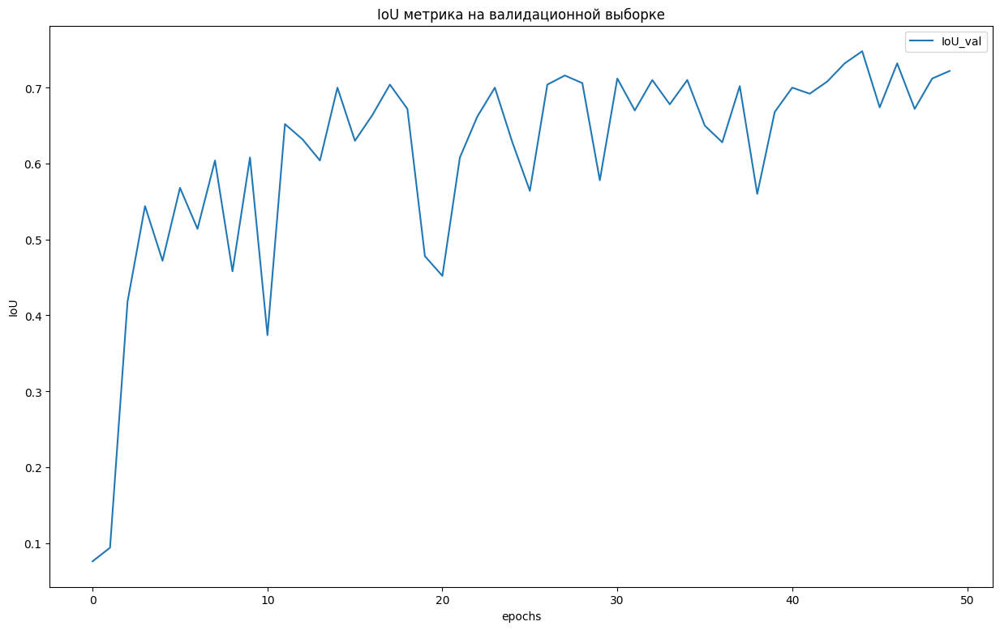

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(val_iou, label="IoU_val")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("IoU")
plt.title("IoU метрика на валидационной выборке")
plt.show()

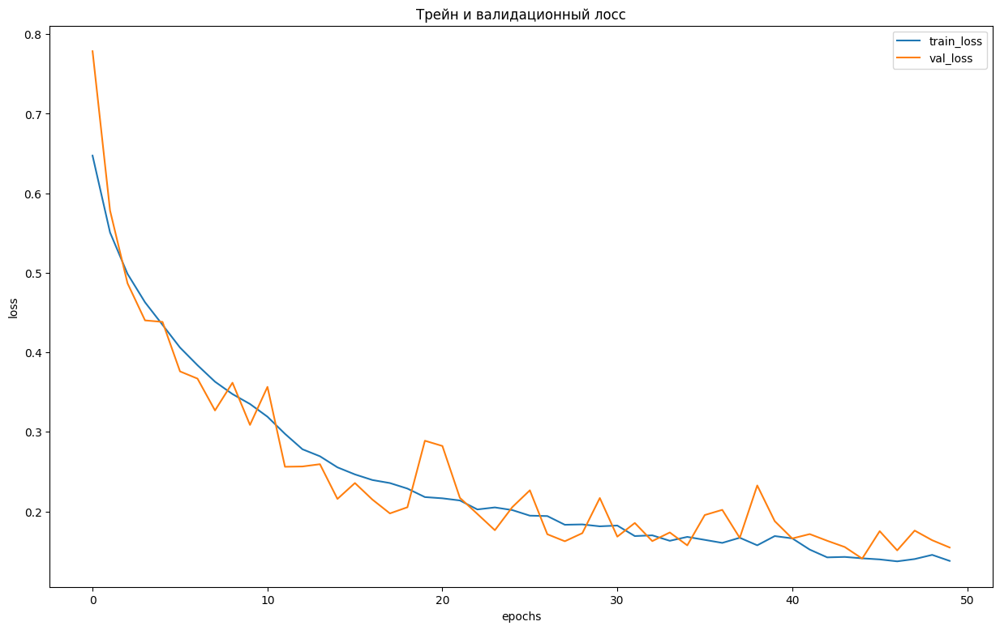

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(loss, label="train_loss")
plt.plot(val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Трейн и валидационный лосс")
plt.show()

In [ ]:
print(f"IoU_test: {score_model(model, iou_pytorch, data_val)}")

IoU_test: 0.722000002861023


Ответьте себе на вопрос: не переобучается ли моя модель?

In [ ]:
def dice_loss(y_real, y_pred):
    num =
    den =
    res =
    return res

Проводим тестирование:

In [ ]:
model_dice = SegNet().to(device)

max_epochs = 40
optimaizer = optim.Adam(model_dice.parameters())
train(model_dice, optimaizer, dice_loss, max_epochs, data_tr, data_val)

In [ ]:
score_model(model_dice, iou_pytorch, data_val)

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [ ]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
    y_pred =  # hint: torch.clamp
    return your_loss


In [ ]:
model_focal = SegNet().to(device)

max_epochs = 40
optimaizer = optim.Adam(model_focal.parameters())
train(model_focal, optimaizer, focal_loss, max_epochs, data_tr, data_val)

In [ ]:
score_model(model_focal, iou_pytorch, data_val)

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты?

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

-----------------------------------------------------------------------------------------

# U-Net [2 балла] (Не реализовано)

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

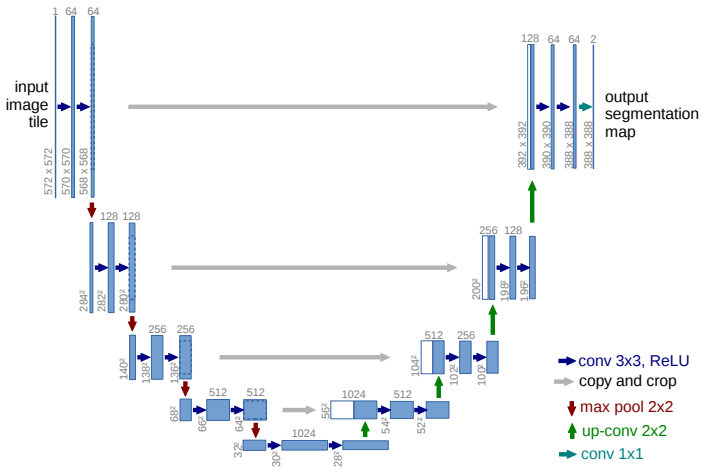

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла]

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


# SegNet Dice Loss

In [ ]:
def dice_loss(logits, target):
    """This definition generalize to real valued pred and target vector.
    This should be differentiable.
    pred: tensor with first dimension as batch
    target: tensor with first dimension as batch
    """

    smooth = 1e-8
    sigmoid = torch.nn.Sigmoid()
    pred = sigmoid(logits)
    # have to use contiguous since they may from a torch.view op
    iflat = pred.contiguous().view(-1)
    tflat = target.contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)

    return 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )

In [ ]:
model = SegNet()

In [ ]:
optim = torch.optim.Adam(model.parameters(), lr=1e-3)

In [ ]:
max_epochs = 50
log2 = train(model, optim, dice_loss,iou_pytorch,  max_epochs, data_tr, data_val, log_name="dice_loss_log")

In [ ]:
loss, val_loss, val_iou = zip(*log2)


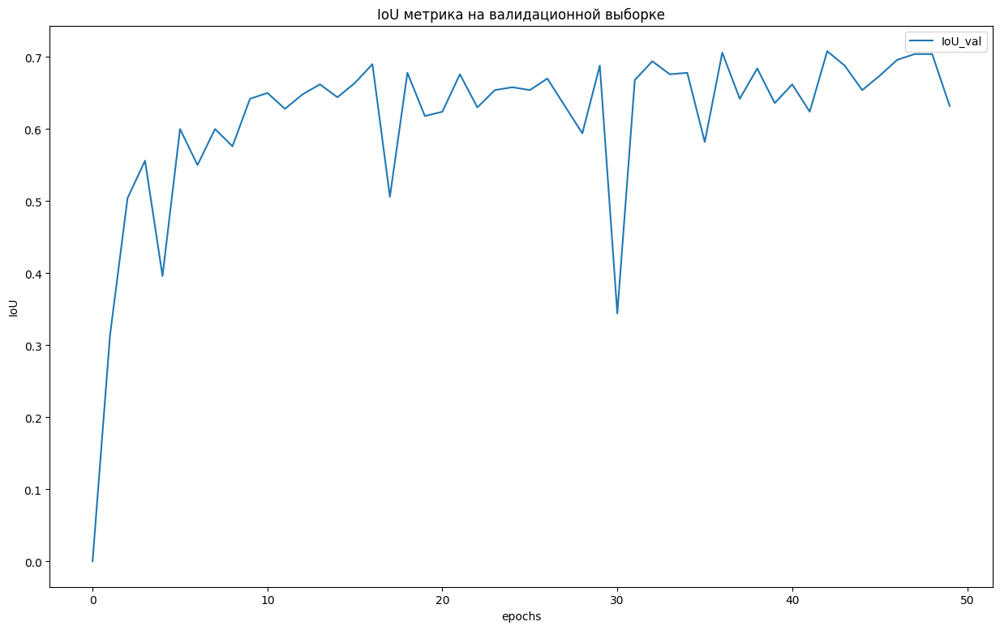

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(val_iou, label="IoU_val")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("IoU")
plt.title("IoU метрика на валидационной выборке")
plt.show()

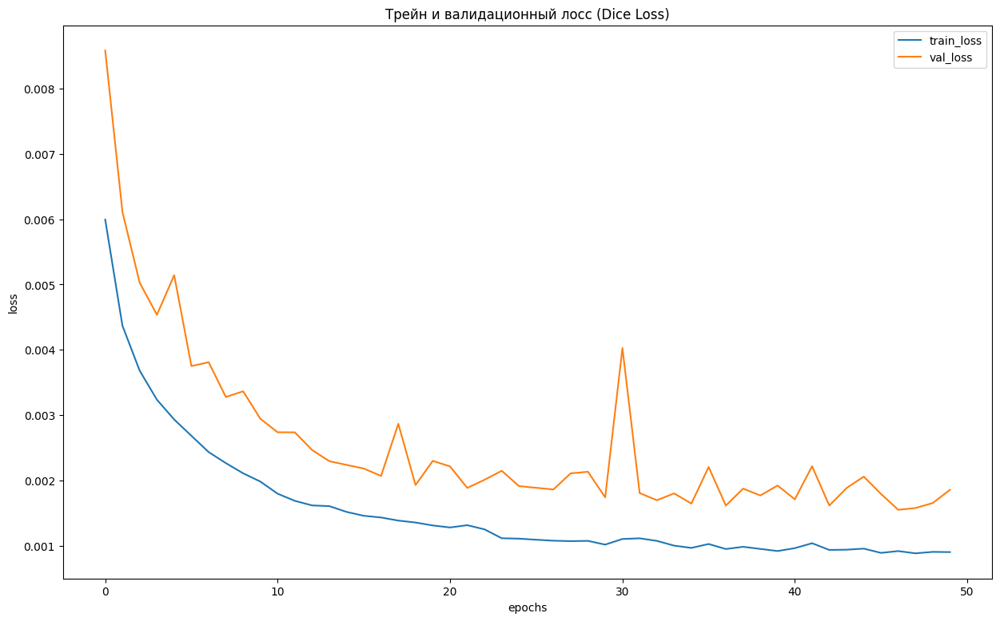

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(loss, label="train_loss")
plt.plot(val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Трейн и валидационный лосс (Dice Loss)")
plt.show()

In [ ]:
score_model(model, iou_pytorch, data_ts)

0.6860000491142273

# SegNet Focal Loss

In [ ]:
from torchvision.ops import sigmoid_focal_loss
def focal_loss(inputs: torch.Tensor, targets: torch.Tensor):
    return sigmoid_focal_loss(inputs, targets, reduction="sum")

In [ ]:
model = SegNet()

In [ ]:
optim = torch.optim.Adam(model.parameters(), lr=1e-3)

100%|██████████| 22/22 [00:04<00:00,  5.27it/s]


epoch: 01, epoch_time: 4.180, train_loss: 0.060, val_loss 0.064, val_IoU: 0.000


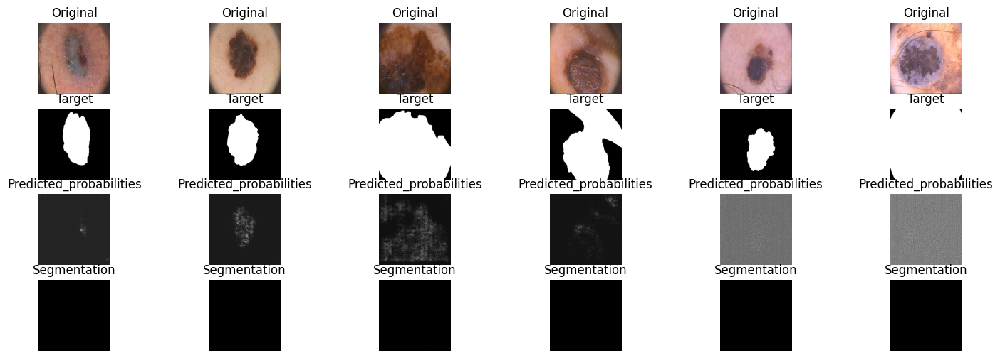

100%|██████████| 22/22 [00:02<00:00,  8.53it/s]


epoch: 02, epoch_time: 2.581, train_loss: 0.047, val_loss 0.046, val_IoU: 0.002


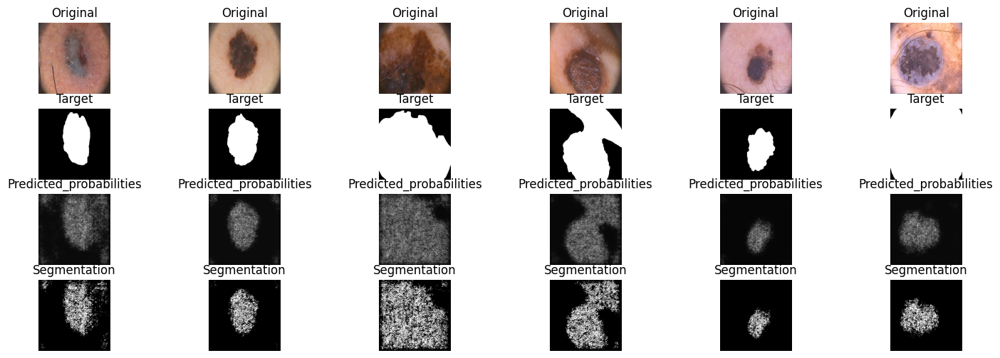

100%|██████████| 22/22 [00:02<00:00,  8.82it/s]


epoch: 03, epoch_time: 2.499, train_loss: 0.041, val_loss 0.046, val_IoU: 0.418


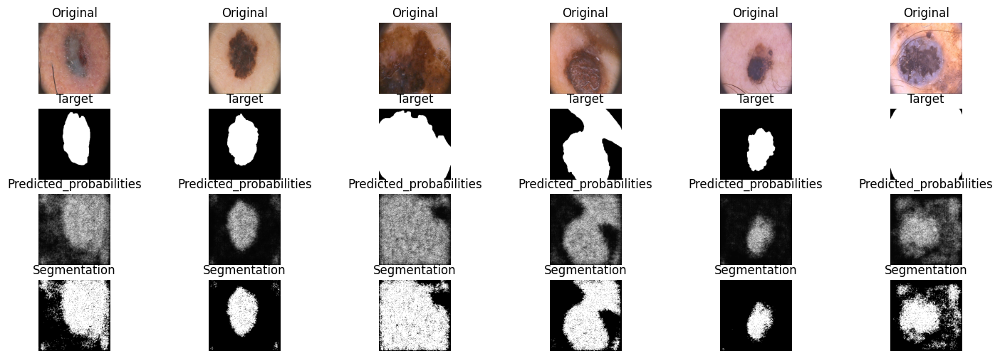

100%|██████████| 22/22 [00:02<00:00,  8.80it/s]


epoch: 04, epoch_time: 2.505, train_loss: 0.036, val_loss 0.044, val_IoU: 0.338


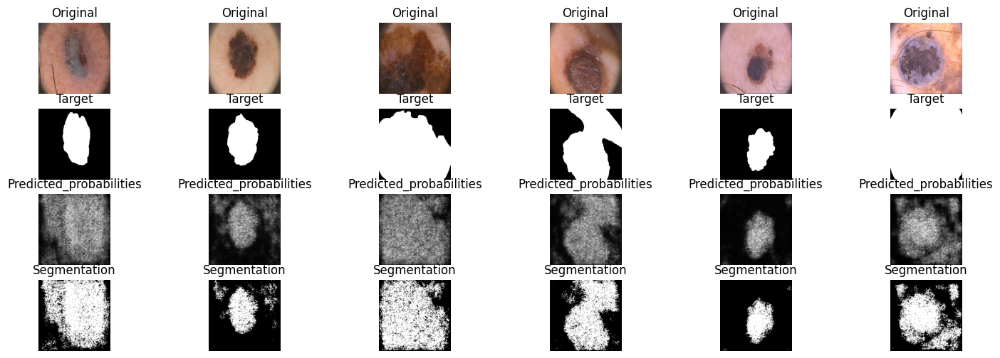

100%|██████████| 22/22 [00:02<00:00,  8.47it/s]


epoch: 05, epoch_time: 2.602, train_loss: 0.034, val_loss 0.054, val_IoU: 0.506


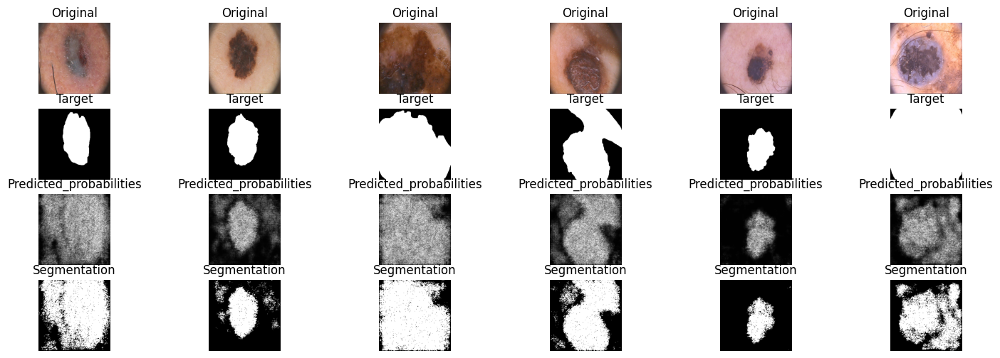

100%|██████████| 22/22 [00:02<00:00,  8.77it/s]


epoch: 06, epoch_time: 2.512, train_loss: 0.030, val_loss 0.031, val_IoU: 0.520


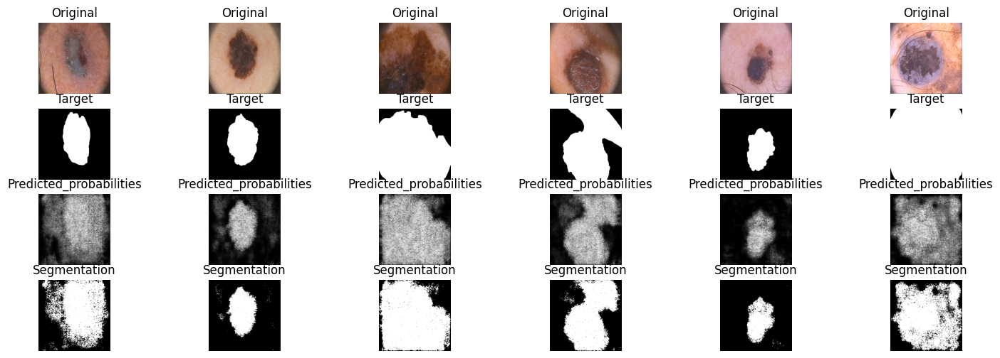

100%|██████████| 22/22 [00:02<00:00,  8.74it/s]


epoch: 07, epoch_time: 2.521, train_loss: 0.029, val_loss 0.034, val_IoU: 0.546


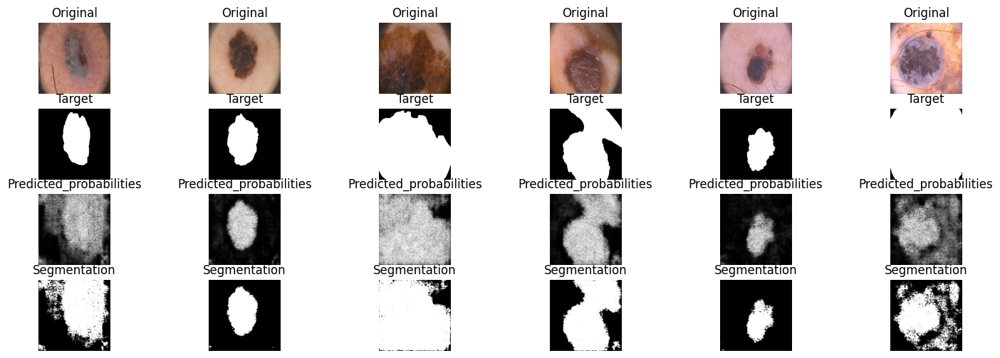

100%|██████████| 22/22 [00:02<00:00,  8.42it/s]


epoch: 08, epoch_time: 2.616, train_loss: 0.027, val_loss 0.033, val_IoU: 0.604


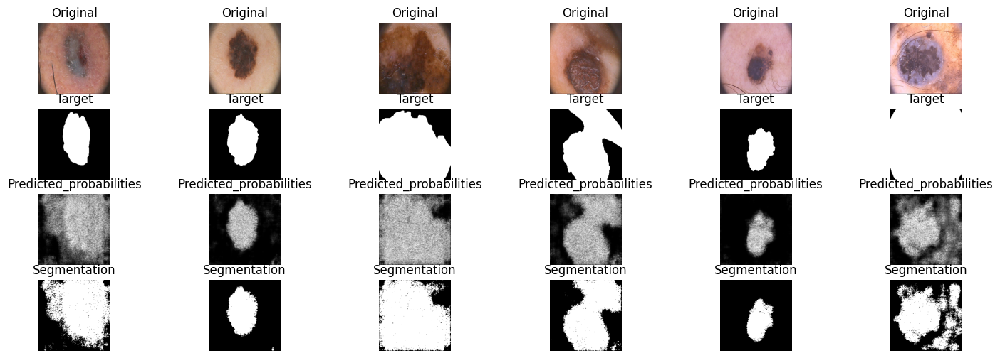

100%|██████████| 22/22 [00:02<00:00,  8.63it/s]


epoch: 09, epoch_time: 2.553, train_loss: 0.026, val_loss 0.031, val_IoU: 0.588


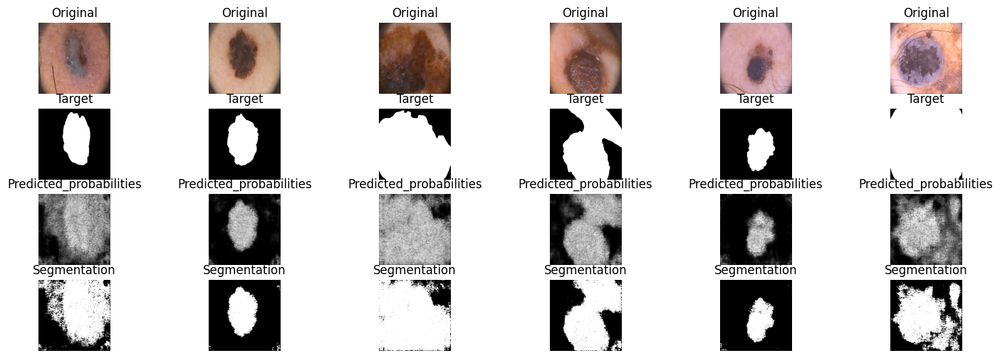

100%|██████████| 22/22 [00:02<00:00,  8.70it/s]


epoch: 10, epoch_time: 2.532, train_loss: 0.025, val_loss 0.034, val_IoU: 0.614


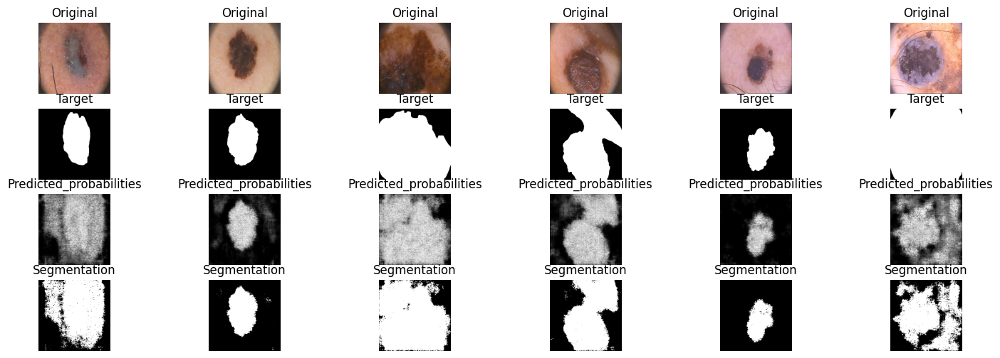

100%|██████████| 22/22 [00:02<00:00,  8.68it/s]


epoch: 11, epoch_time: 2.540, train_loss: 0.024, val_loss 0.038, val_IoU: 0.608


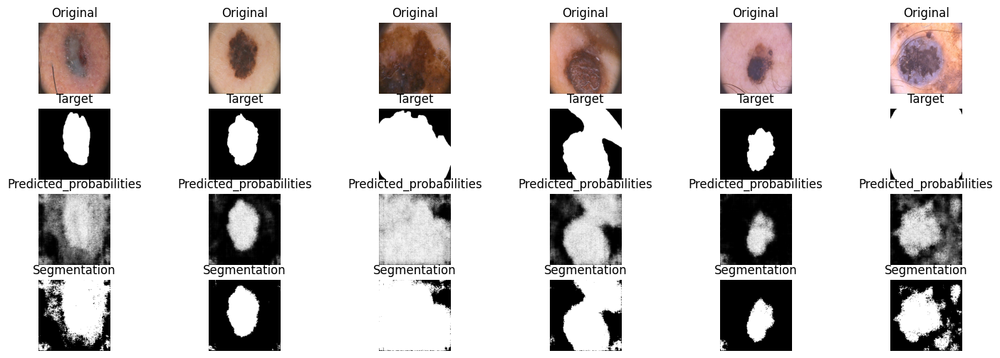

100%|██████████| 22/22 [00:02<00:00,  8.40it/s]


epoch: 12, epoch_time: 2.639, train_loss: 0.023, val_loss 0.026, val_IoU: 0.580


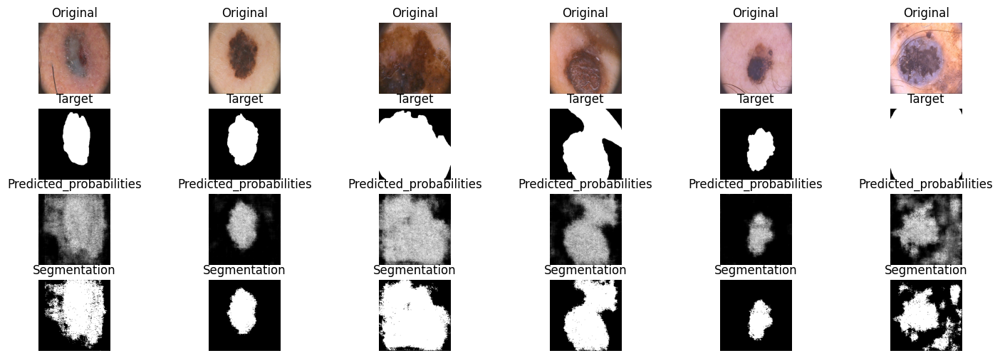

100%|██████████| 22/22 [00:02<00:00,  8.65it/s]


epoch: 13, epoch_time: 2.547, train_loss: 0.022, val_loss 0.040, val_IoU: 0.638


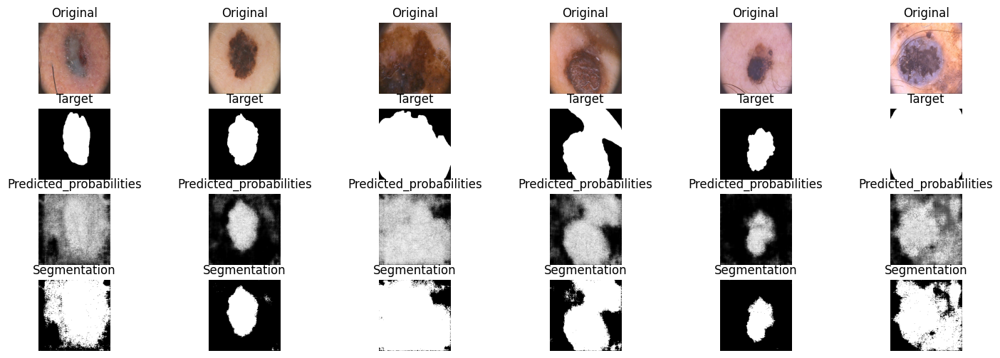

100%|██████████| 22/22 [00:02<00:00,  8.64it/s]


epoch: 14, epoch_time: 2.551, train_loss: 0.021, val_loss 0.027, val_IoU: 0.634


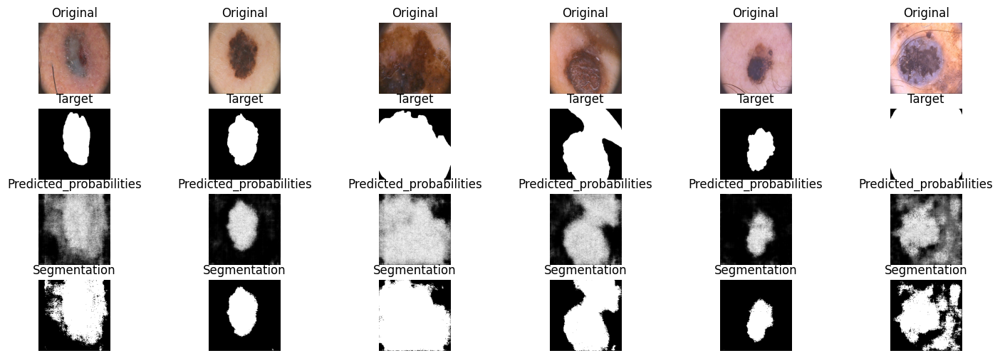

100%|██████████| 22/22 [00:02<00:00,  8.34it/s]


epoch: 15, epoch_time: 2.642, train_loss: 0.020, val_loss 0.027, val_IoU: 0.634


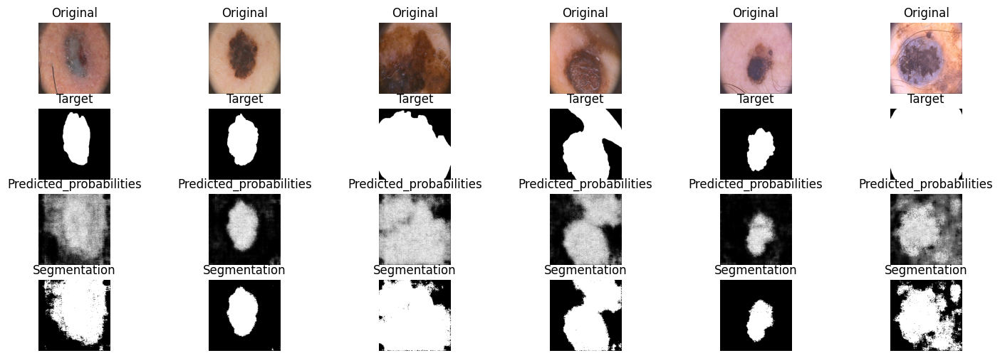

100%|██████████| 22/22 [00:02<00:00,  8.60it/s]


epoch: 16, epoch_time: 2.562, train_loss: 0.020, val_loss 0.027, val_IoU: 0.598


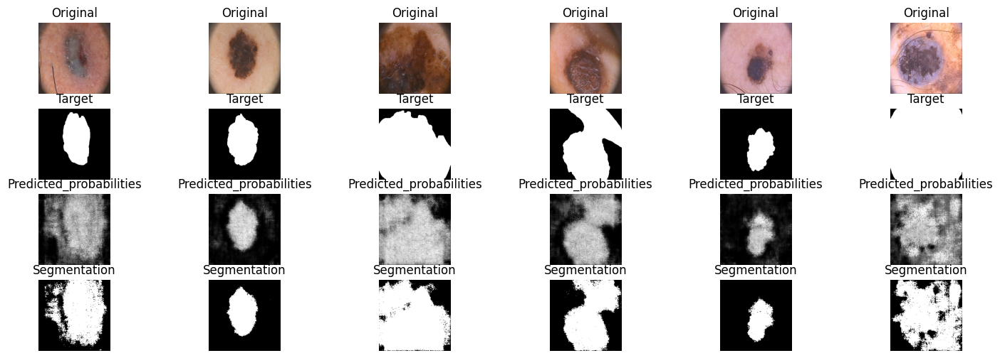

100%|██████████| 22/22 [00:02<00:00,  8.59it/s]


epoch: 17, epoch_time: 2.566, train_loss: 0.020, val_loss 0.024, val_IoU: 0.600


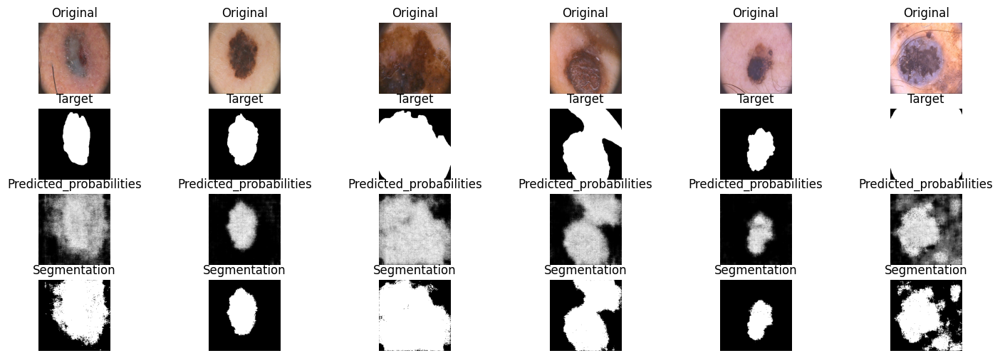

100%|██████████| 22/22 [00:02<00:00,  8.25it/s]


epoch: 18, epoch_time: 2.675, train_loss: 0.019, val_loss 0.026, val_IoU: 0.622


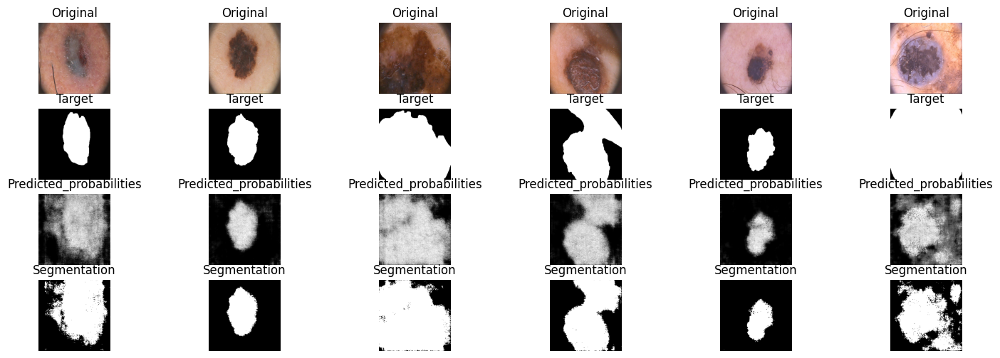

100%|██████████| 22/22 [00:02<00:00,  8.52it/s]


epoch: 19, epoch_time: 2.586, train_loss: 0.019, val_loss 0.026, val_IoU: 0.614


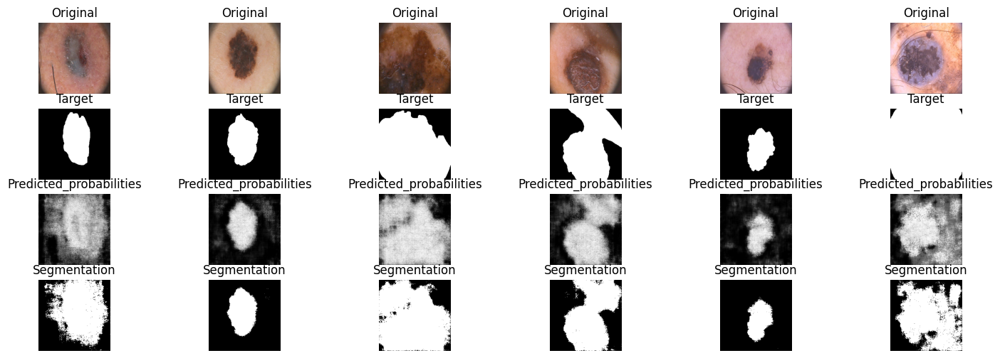

100%|██████████| 22/22 [00:02<00:00,  8.52it/s]


epoch: 20, epoch_time: 2.587, train_loss: 0.019, val_loss 0.028, val_IoU: 0.656


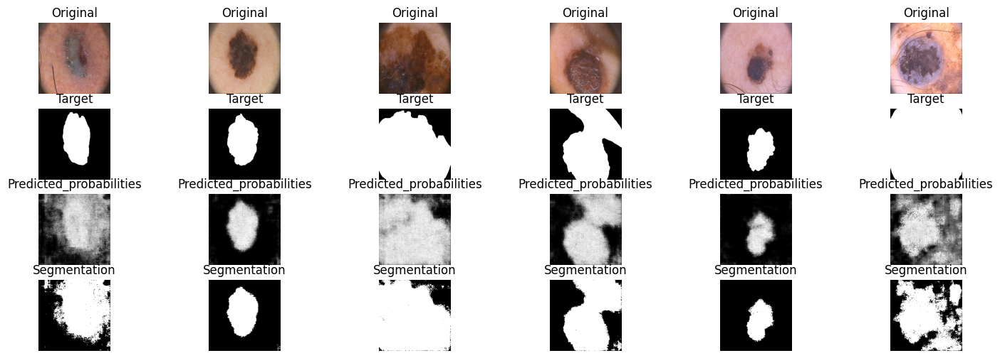

100%|██████████| 22/22 [00:02<00:00,  8.14it/s]


epoch: 21, epoch_time: 2.706, train_loss: 0.018, val_loss 0.022, val_IoU: 0.608


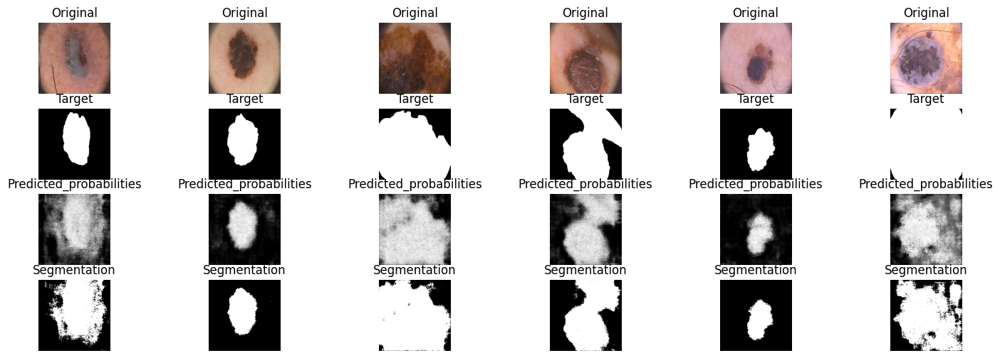

100%|██████████| 22/22 [00:02<00:00,  8.39it/s]


epoch: 22, epoch_time: 2.627, train_loss: 0.018, val_loss 0.026, val_IoU: 0.588


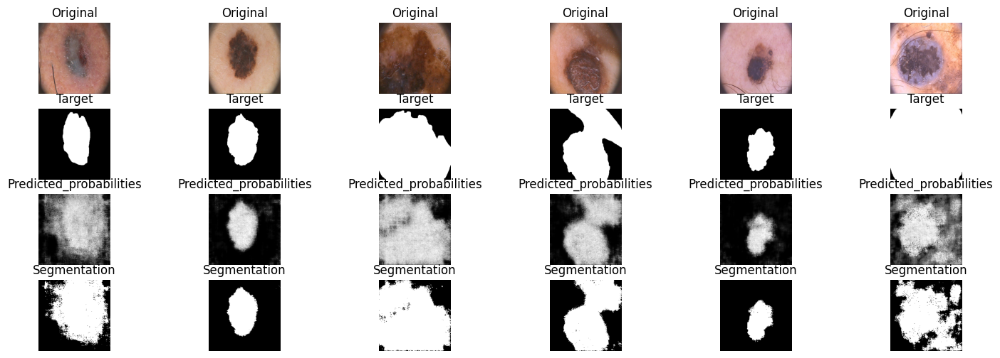

100%|██████████| 22/22 [00:02<00:00,  8.43it/s]


epoch: 23, epoch_time: 2.614, train_loss: 0.018, val_loss 0.027, val_IoU: 0.590


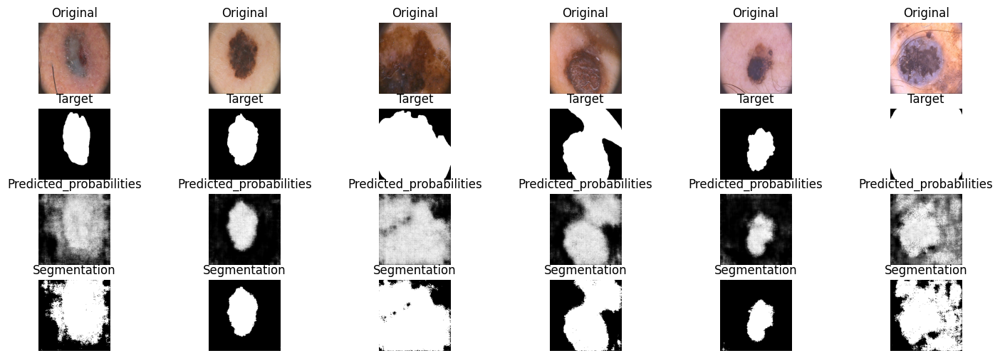

100%|██████████| 22/22 [00:02<00:00,  8.19it/s]


epoch: 24, epoch_time: 2.692, train_loss: 0.018, val_loss 0.022, val_IoU: 0.522


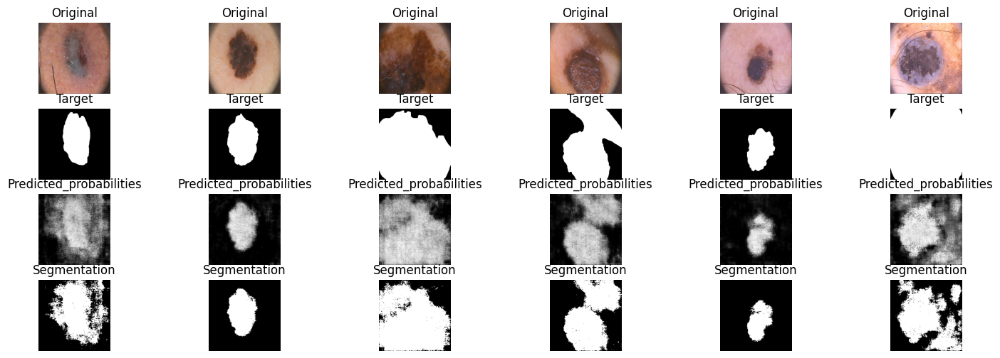

100%|██████████| 22/22 [00:02<00:00,  8.42it/s]


epoch: 25, epoch_time: 2.618, train_loss: 0.017, val_loss 0.025, val_IoU: 0.624


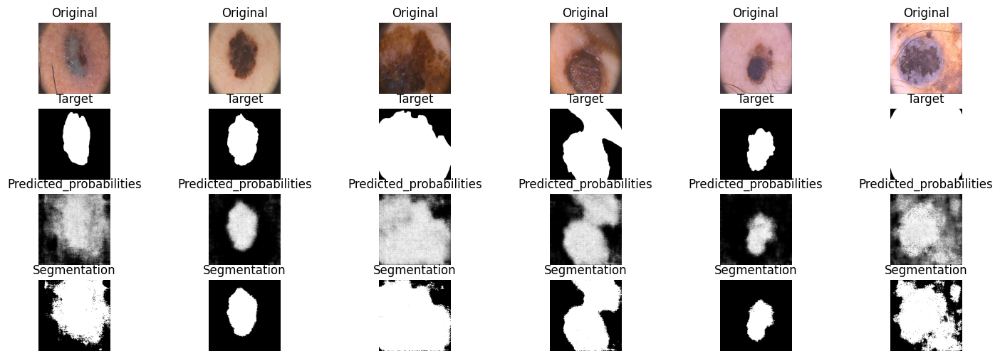

100%|██████████| 22/22 [00:02<00:00,  8.37it/s]


epoch: 26, epoch_time: 2.633, train_loss: 0.018, val_loss 0.040, val_IoU: 0.660


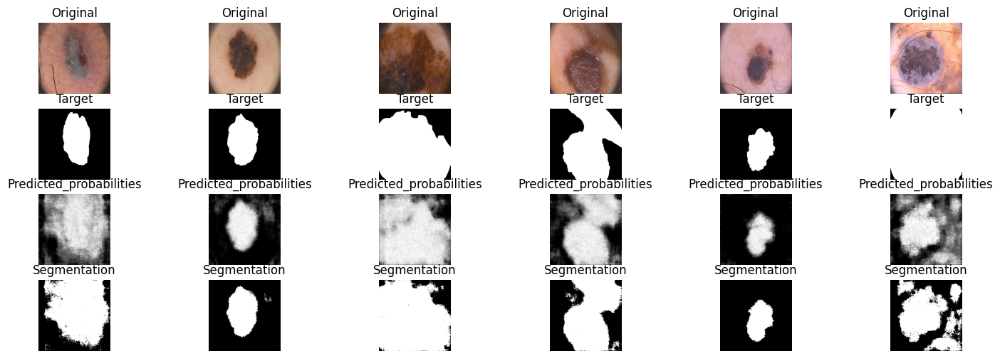

100%|██████████| 22/22 [00:02<00:00,  8.39it/s]


epoch: 27, epoch_time: 2.627, train_loss: 0.017, val_loss 0.026, val_IoU: 0.600


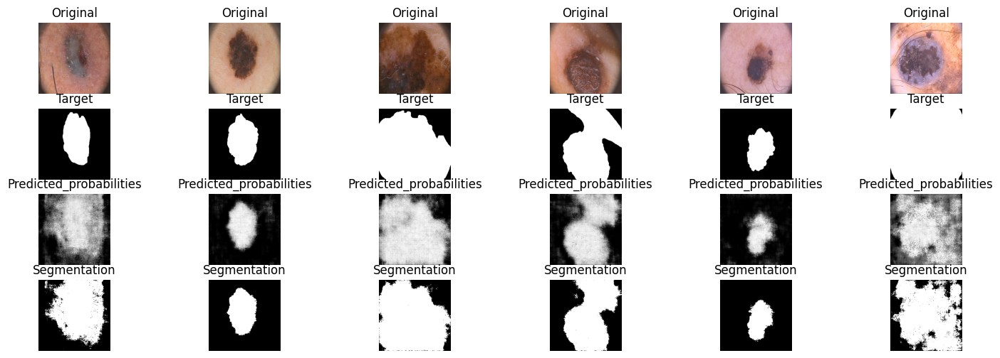

100%|██████████| 22/22 [00:02<00:00,  8.11it/s]


epoch: 28, epoch_time: 2.717, train_loss: 0.016, val_loss 0.026, val_IoU: 0.624


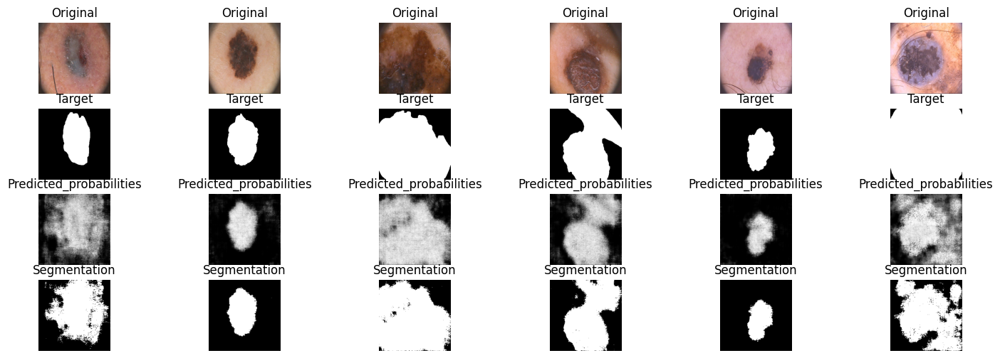

100%|██████████| 22/22 [00:02<00:00,  8.33it/s]


epoch: 29, epoch_time: 2.646, train_loss: 0.017, val_loss 0.030, val_IoU: 0.592


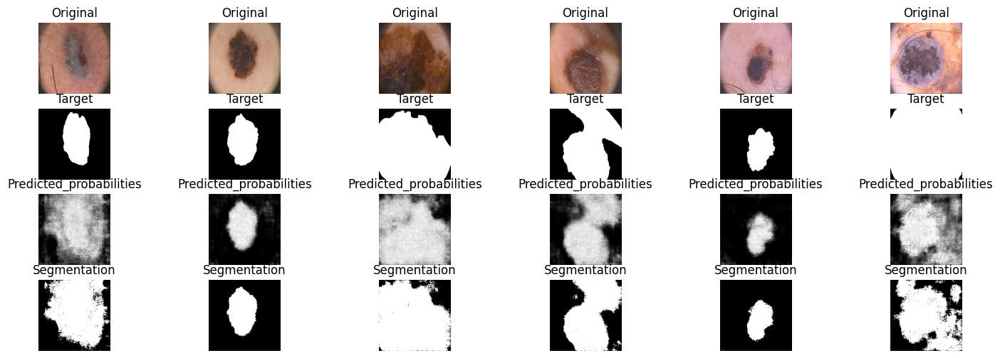

100%|██████████| 22/22 [00:02<00:00,  8.28it/s]


epoch: 30, epoch_time: 2.661, train_loss: 0.017, val_loss 0.027, val_IoU: 0.676


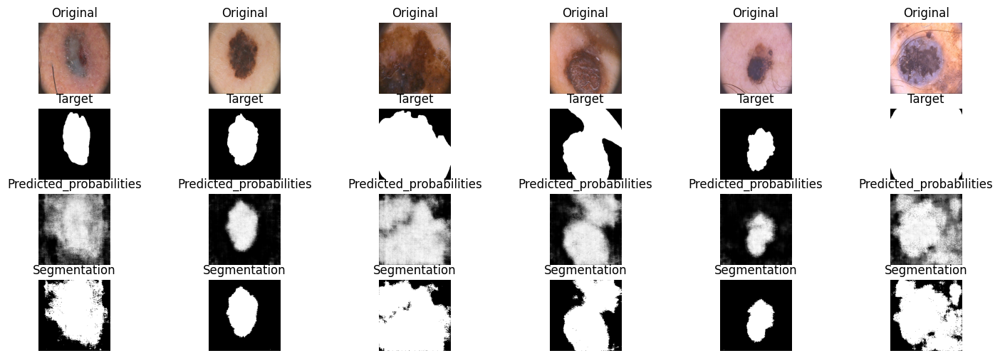

100%|██████████| 22/22 [00:02<00:00,  7.98it/s]


epoch: 31, epoch_time: 2.765, train_loss: 0.017, val_loss 0.025, val_IoU: 0.624


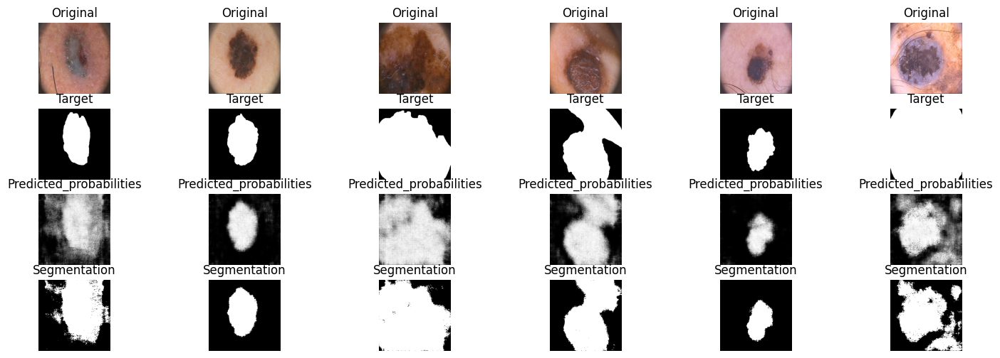

100%|██████████| 22/22 [00:02<00:00,  8.17it/s]


epoch: 32, epoch_time: 2.698, train_loss: 0.017, val_loss 0.025, val_IoU: 0.616


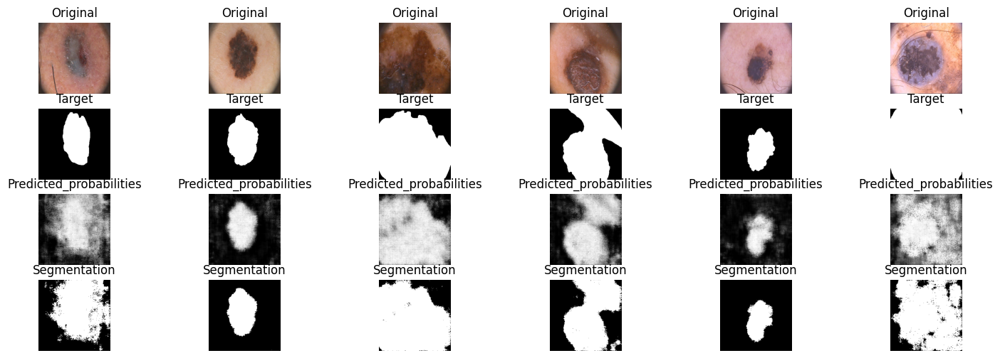

100%|██████████| 22/22 [00:02<00:00,  8.18it/s]


epoch: 33, epoch_time: 2.692, train_loss: 0.017, val_loss 0.021, val_IoU: 0.544


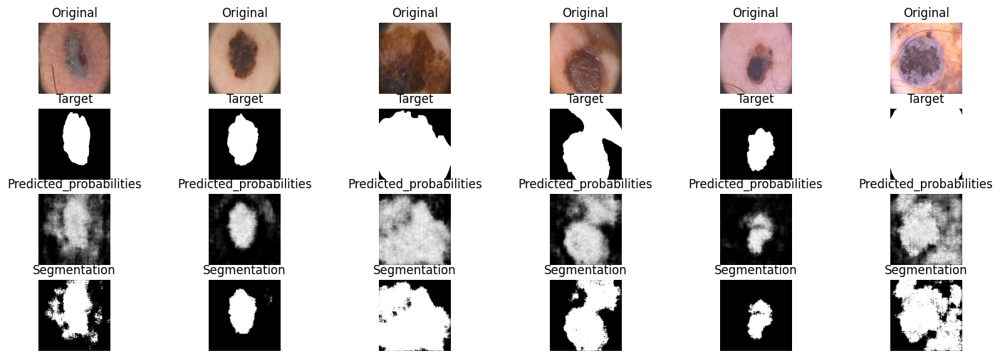

100%|██████████| 22/22 [00:02<00:00,  7.93it/s]


epoch: 34, epoch_time: 2.781, train_loss: 0.017, val_loss 0.028, val_IoU: 0.600


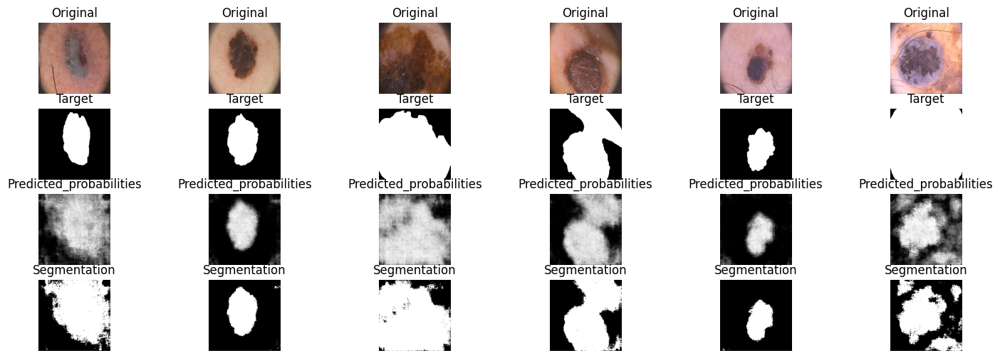

100%|██████████| 22/22 [00:02<00:00,  8.16it/s]


epoch: 35, epoch_time: 2.700, train_loss: 0.016, val_loss 0.024, val_IoU: 0.610


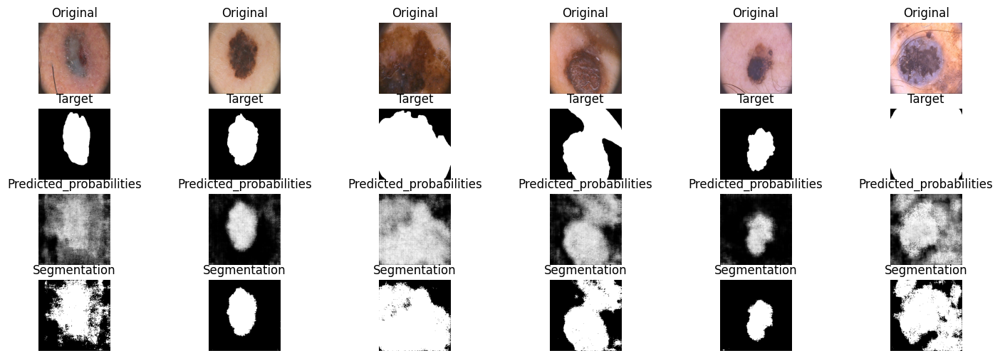

100%|██████████| 22/22 [00:02<00:00,  8.19it/s]


epoch: 36, epoch_time: 2.690, train_loss: 0.016, val_loss 0.027, val_IoU: 0.636


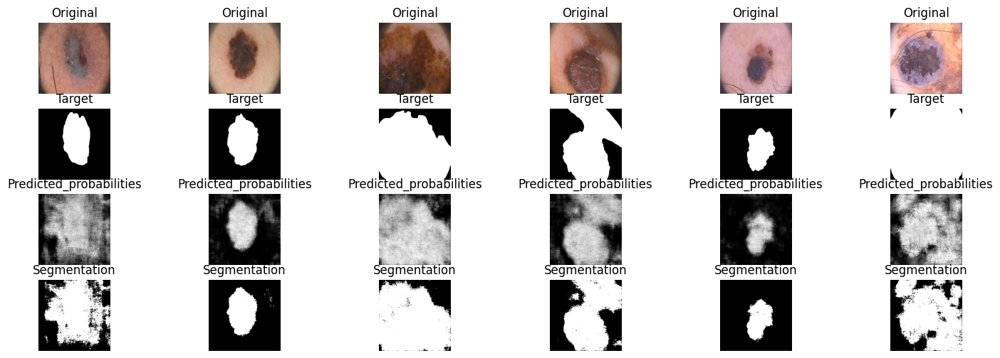

100%|██████████| 22/22 [00:02<00:00,  7.97it/s]


epoch: 37, epoch_time: 2.764, train_loss: 0.016, val_loss 0.023, val_IoU: 0.606


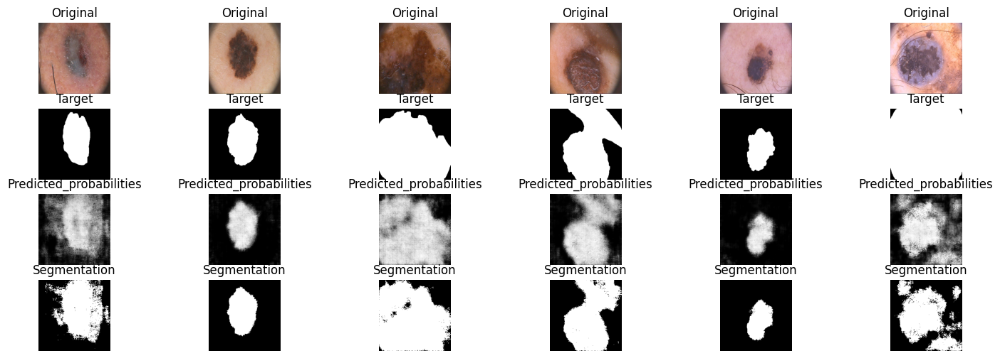

100%|██████████| 22/22 [00:02<00:00,  8.20it/s]


epoch: 38, epoch_time: 2.688, train_loss: 0.015, val_loss 0.026, val_IoU: 0.588


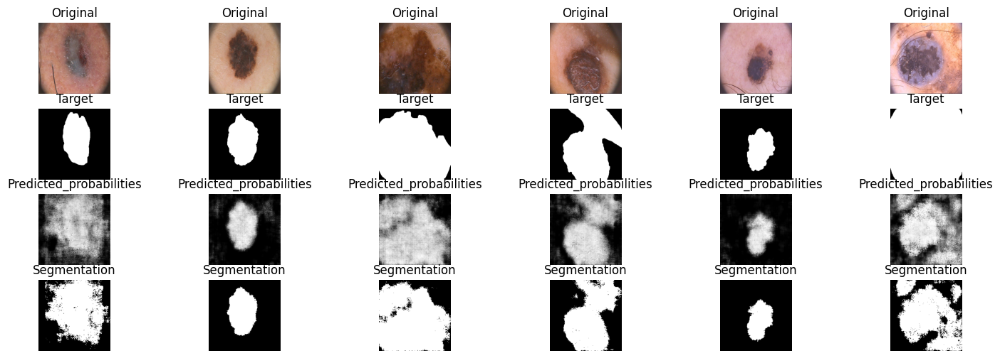

100%|██████████| 22/22 [00:02<00:00,  8.20it/s]


epoch: 39, epoch_time: 2.688, train_loss: 0.016, val_loss 0.025, val_IoU: 0.582


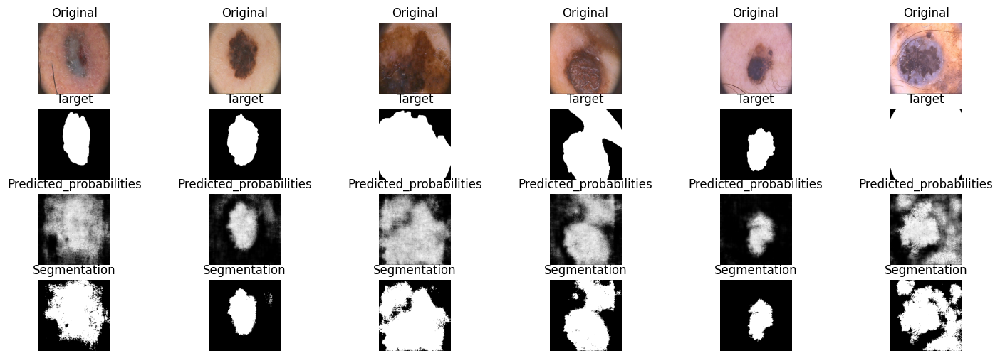

100%|██████████| 22/22 [00:02<00:00,  8.01it/s]


epoch: 40, epoch_time: 2.751, train_loss: 0.015, val_loss 0.034, val_IoU: 0.624


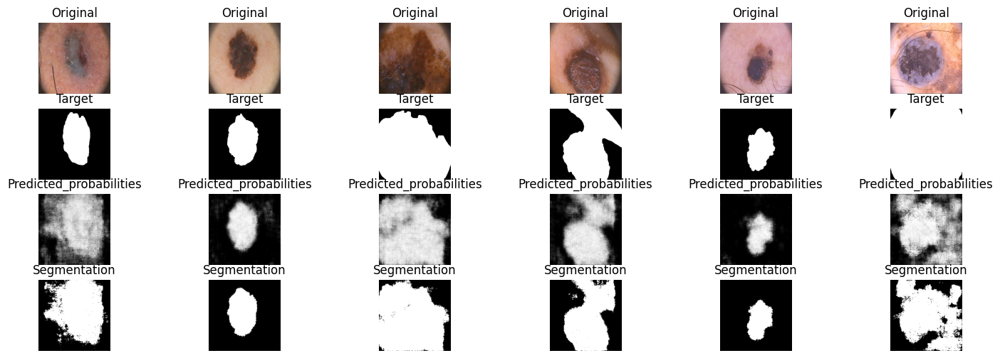

100%|██████████| 22/22 [00:02<00:00,  8.30it/s]


epoch: 41, epoch_time: 2.657, train_loss: 0.017, val_loss 0.036, val_IoU: 0.658


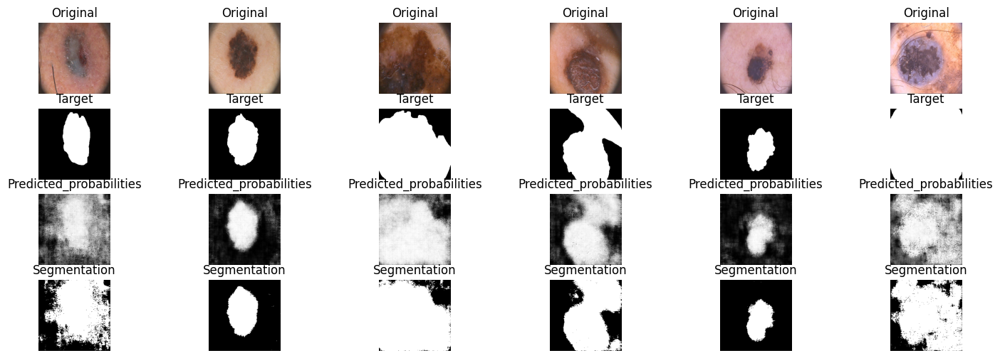

100%|██████████| 22/22 [00:02<00:00,  8.26it/s]


epoch: 42, epoch_time: 2.666, train_loss: 0.018, val_loss 0.021, val_IoU: 0.562


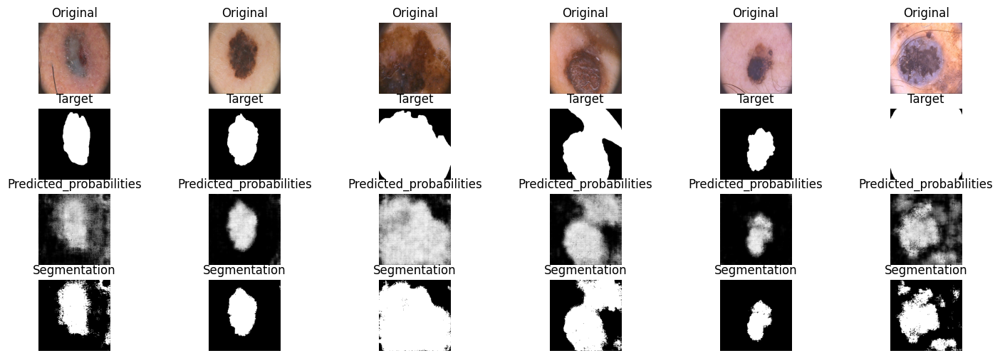

100%|██████████| 22/22 [00:02<00:00,  8.26it/s]


epoch: 43, epoch_time: 2.666, train_loss: 0.016, val_loss 0.028, val_IoU: 0.630


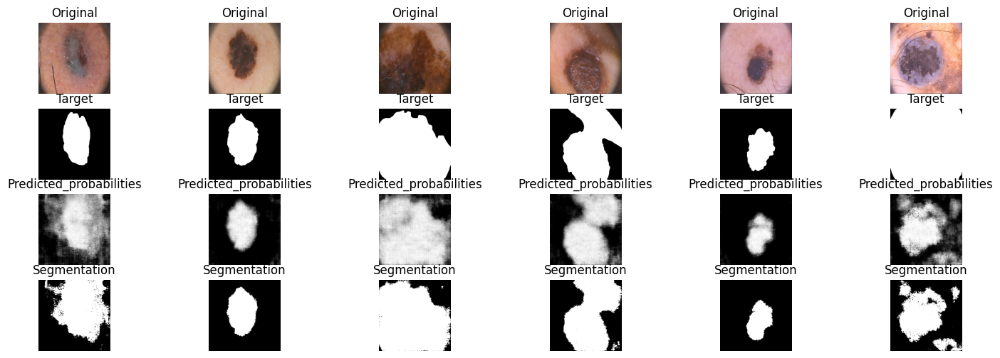

100%|██████████| 22/22 [00:02<00:00,  8.07it/s]


epoch: 44, epoch_time: 2.730, train_loss: 0.016, val_loss 0.025, val_IoU: 0.652


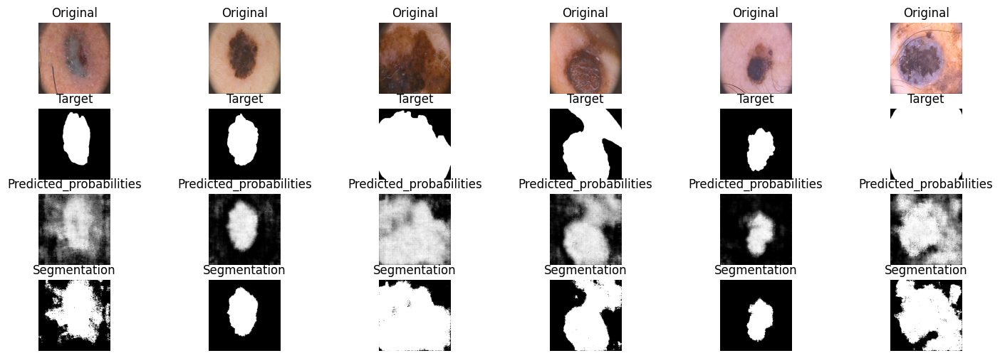

100%|██████████| 22/22 [00:02<00:00,  8.26it/s]


epoch: 45, epoch_time: 2.666, train_loss: 0.015, val_loss 0.023, val_IoU: 0.632


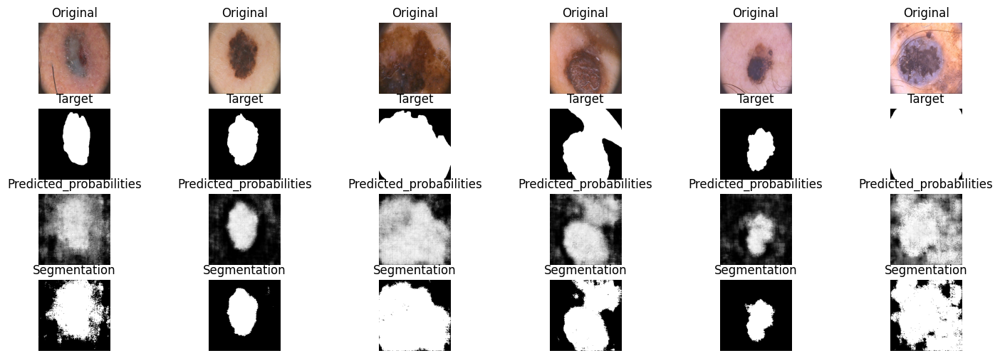

100%|██████████| 22/22 [00:02<00:00,  8.27it/s]


epoch: 46, epoch_time: 2.663, train_loss: 0.015, val_loss 0.025, val_IoU: 0.626


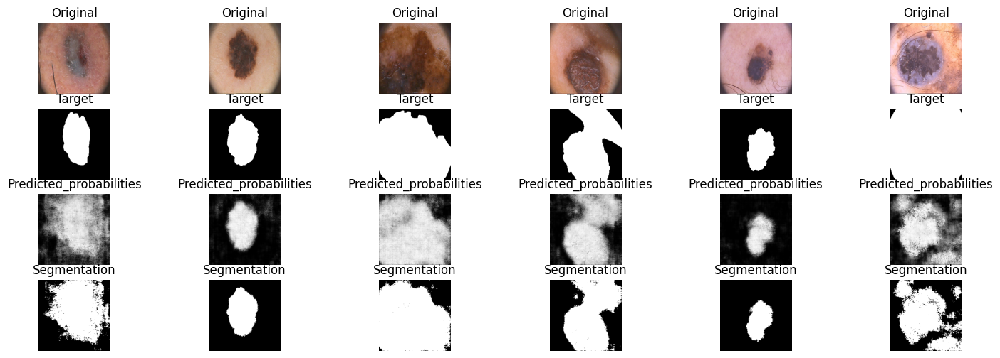

100%|██████████| 22/22 [00:02<00:00,  8.05it/s]


epoch: 47, epoch_time: 2.738, train_loss: 0.015, val_loss 0.026, val_IoU: 0.630


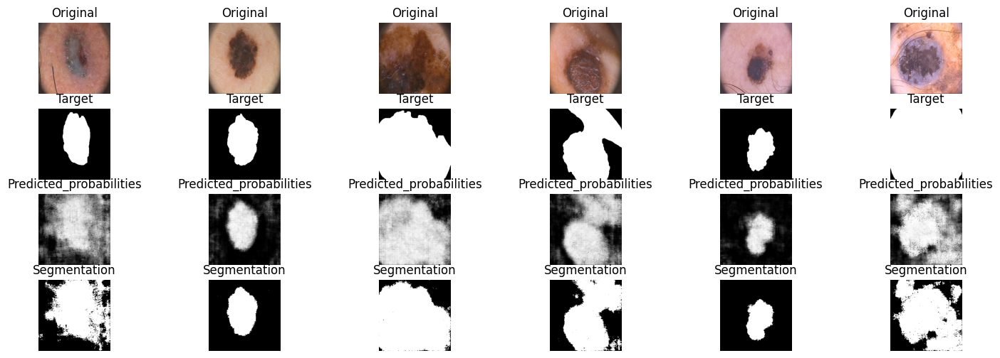

100%|██████████| 22/22 [00:02<00:00,  8.27it/s]


epoch: 48, epoch_time: 2.672, train_loss: 0.014, val_loss 0.028, val_IoU: 0.678


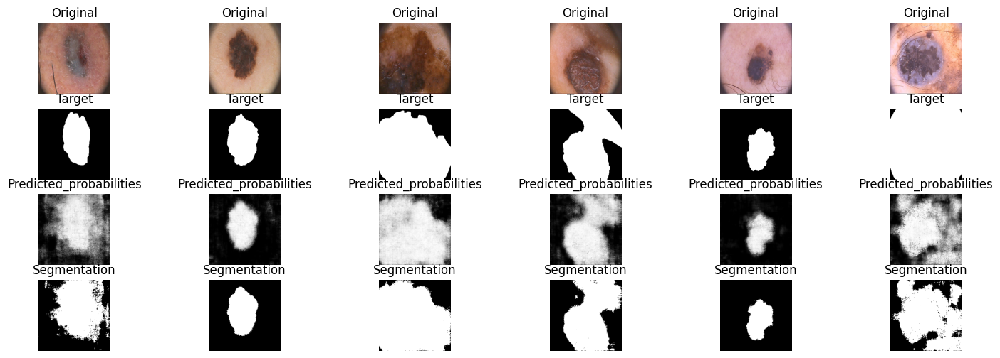

100%|██████████| 22/22 [00:02<00:00,  8.24it/s]


epoch: 49, epoch_time: 2.672, train_loss: 0.014, val_loss 0.022, val_IoU: 0.620


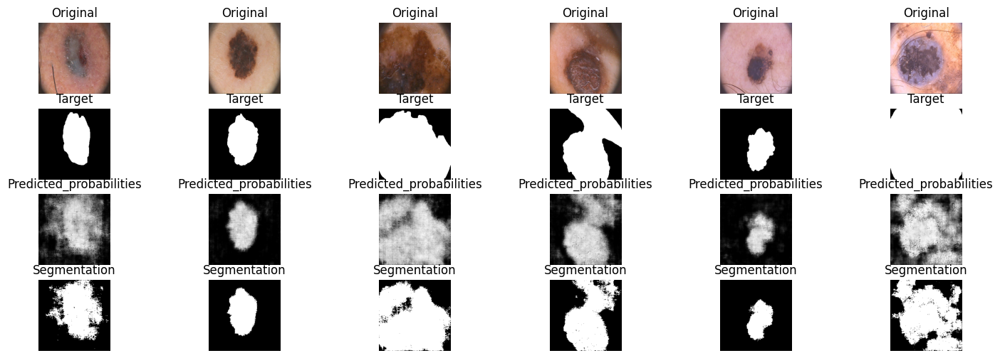

100%|██████████| 22/22 [00:02<00:00,  7.99it/s]


epoch: 50, epoch_time: 2.756, train_loss: 0.014, val_loss 0.035, val_IoU: 0.690


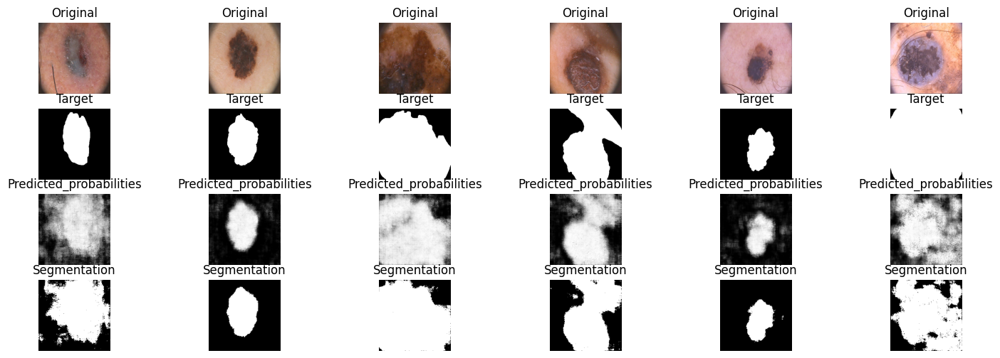

In [ ]:
max_epochs = 50
log3 = train(model, optim, focal_loss,iou_pytorch,  max_epochs, data_tr, data_val, log_name="focal_loss_log")

In [ ]:
loss, val_loss, val_iou = zip(*log3)


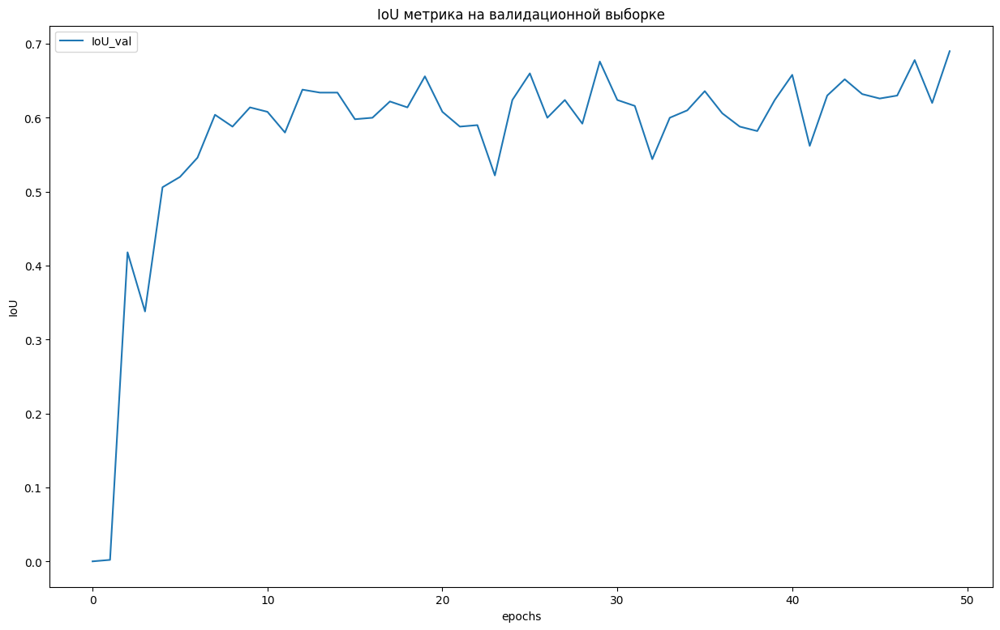

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(val_iou, label="IoU_val")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("IoU")
plt.title("IoU метрика на валидационной выборке")
plt.show()

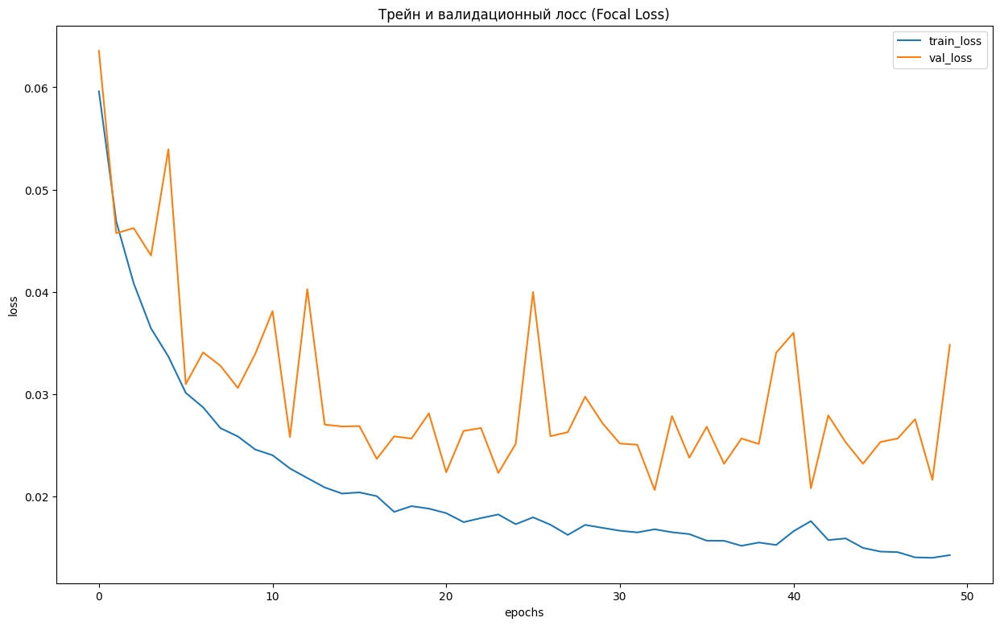

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(loss, label="train_loss")
plt.plot(val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Трейн и валидационный лосс (Focal Loss)")
plt.show()

In [ ]:
score_model(model, iou_pytorch, data_ts)

0.6399999856948853

Сделайте вывод, какая из моделей лучше

# Отчет (6 баллов):
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте.
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии:

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.

# Отчёт о проделанной работе

Датасет в 200 картинок был поделён на 100, 50, 50 (train, val, test соответственно). Была применена агументация к train и train_aug стал размером 1100 картинок. На нём в 50 эпох обучалась модель типа SegNet с порядка 50,000 параметров. Были протестированы 3 лосса: Cross-Enthropy, Dice Loss и Focal Loss. Сравнение данных лоссов представлено ниже. Видно что обычная кросс-энтропия отработала лучше

In [ ]:
import pickle
with open("/kaggle/working/seg_net_log.pickle", 'rb') as handle:
    log_ce = pickle.load(handle)
with open("/kaggle/working/dice_loss_log.pickle", 'rb') as handle:
    log_dl = pickle.load(handle)
with open("/kaggle/working/focal_loss_log.pickle", 'rb') as handle:
    log_fl = pickle.load(handle)

In [ ]:
_, _, iou_ce = zip(*log_ce)
_, _, iou_dl = zip(*log_dl)
_, _, iou_fl = zip(*log_fl)

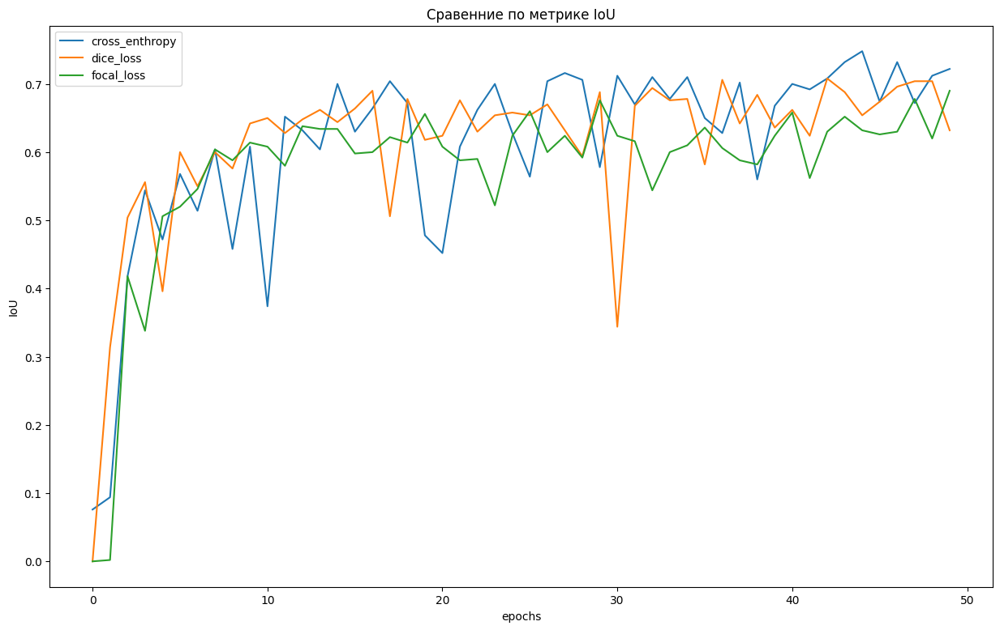

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot(iou_ce, label="cross_enthropy")
plt.plot(iou_dl, label="dice_loss")
plt.plot(iou_fl, label="focal_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("IoU")
plt.title("Сравенние по метрике IoU")
plt.show()